In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import root_pandas as rp
import pandas as pd
from tqdm import tqdm
from scipy.special import erfc

from scipy.optimize import curve_fit

Welcome to JupyROOT 6.22/00


In [2]:
def func(x, a, b, c):
    """
    a => sigma_l + sigma_t
    b => epsilon*sigma_tt
    c => Sqrt(2epsilon(1+epsilon))* sigma_lt
    """
    f = a + b * np.cos(2*x) + c * np.cos(x)
    return f

def degauss(x, A, mu, sigma, lambda1, lambda2):
    mu1 = sigma * sigma * lambda1 + x - mu
    mu2 = -sigma * sigma * lambda2 + x - mu
    ret = A * 0.5 / (1.0 / lambda1 + 1.0 / lambda2) * \
        (np.exp(0.5 * np.power(sigma * lambda1, 2) + lambda1 * (x - mu)) * erfc(mu1 / (sigma * np.sqrt(2.0))) \
         + np.exp(0.5 * np.power(sigma * lambda2, 2) - lambda2 * (x - mu)) * erfc(-mu2 / (sigma * np.sqrt(2.0))))

    return ret

def gauss(x, A, mu, sig):
    ret = np.exp(-np.power(x - mu, 2.) / (2 * np.power(sig, 2.)))
    return A*ret

def peak(x, c):
    return np.exp(-np.power(x - c, 2) / 16.0)

def lin_interp(x, y, i, half):
    return x[i] + (x[i+1] - x[i]) * ((half - y[i]) / (y[i+1] - y[i]))

def half_max_x(x, y):
    half = np.max(y)/2.0
    signs = np.sign(np.add(y, -half))
    zero_crossings = (signs[0:-2] != signs[1:-1])
    zero_crossings_i = np.where(zero_crossings)[0]
    return [lin_interp(x, y, zero_crossings_i[0], half),
            lin_interp(x, y, zero_crossings_i[1], half)]


In [3]:
df = pd.read_csv("test.csv",index_col=False)
df = df[(df.w > 0) & (df.mm2 > 0.7) & (df.mm2 < 1.5)]
df['cos_theta'] = np.cos(df.theta)

df.head()

,electron_sector,w,q2,theta,phi,mm2,e_p,e_cx,e_cy,e_cz,pip_p,pip_cx,pip_cy,pip_cz,helicty,cos_theta
1,4,1.474648,3.658426,2.183212,5.571179,1.189961,2.839757,-0.469821,-0.024044,0.882434,0.408187,-0.129743,0.400606,0.907018,0,-0.574846
8,5,1.834149,1.350685,0.655029,2.591053,0.856289,3.435651,-0.124673,-0.234357,0.964123,1.800300,0.367060,0.435695,0.821850,0,0.793030
15,6,1.488944,1.481593,0.651157,2.500188,0.830389,3.977200,0.139007,-0.217973,0.966005,1.231690,-0.247862,0.635660,0.731095,0,0.795383
23,1,1.892700,1.308092,1.104745,1.364527,0.774614,3.342066,0.262676,0.034093,0.964282,1.629726,-0.306239,0.357218,0.882391,0,0.449362
26,2,1.177611,1.611081,0.766253,4.952141,0.838107,4.350599,0.112560,0.231896,0.966206,0.612078,-0.068939,-0.637886,0.767039,0,0.720514


In [4]:
def mm_cut(df):
    NSIGMA = 1
    data = []
    for sec in range(1,7):
        y,x = np.histogram(df[df.electron_sector == sec].mm2, bins=500, density=True)
        x=(x[1:]+x[:-1])/2
        popt_g, pcov_g = curve_fit(gauss,x,y, maxfev=8000)
        plt.plot(x, gauss(x,*popt_g), linewidth=2.0)
        
        p0 = [popt_g[0],popt_g[1],popt_g[2], 1.0,1.0]
        popt, pcov = curve_fit(degauss,x,y, maxfev=8000)
        
        plt.errorbar(x,y,yerr=np.sqrt(y)/len(y), marker='.', zorder=1)
        plt.plot(x, degauss(x,*popt), c='#9467bd', linewidth=2.0)
        
        # find the FWHM
        xs= np.linspace(0.7,1.5,100000)
        hmx = half_max_x(xs,degauss(xs,*popt))
        fwhm = hmx[1] - hmx[0]
        
        plt.axvline(popt[1]+NSIGMA*fwhm)
        plt.axvline(popt[1]-NSIGMA*fwhm)
        plt.show()
        data.append(df[(df.electron_sector == sec)
                       &(df.mm2 <= popt[1]+NSIGMA*fwhm)
                       &(df.mm2 >= popt[1]-NSIGMA*fwhm)])
        
        print('{', end='')
        for x in popt:
            print(f'{x:.20f},', end='')
        print('}')
    return data

<ipython-input-2-4c1619d8b6be>:14: RuntimeWarning: overflow encountered in exp
  (np.exp(0.5 * np.power(sigma * lambda1, 2) + lambda1 * (x - mu)) * erfc(mu1 / (sigma * np.sqrt(2.0))) \
<ipython-input-2-4c1619d8b6be>:15: RuntimeWarning: overflow encountered in exp
  + np.exp(0.5 * np.power(sigma * lambda2, 2) - lambda2 * (x - mu)) * erfc(-mu2 / (sigma * np.sqrt(2.0))))
<ipython-input-2-4c1619d8b6be>:15: RuntimeWarning: invalid value encountered in multiply
  + np.exp(0.5 * np.power(sigma * lambda2, 2) - lambda2 * (x - mu)) * erfc(-mu2 / (sigma * np.sqrt(2.0))))
<ipython-input-2-4c1619d8b6be>:14: RuntimeWarning: invalid value encountered in multiply
  (np.exp(0.5 * np.power(sigma * lambda1, 2) + lambda1 * (x - mu)) * erfc(mu1 / (sigma * np.sqrt(2.0))) \


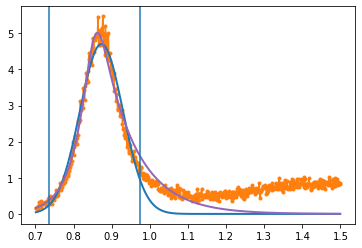

{0.78844837803576983681,0.85584064152930572345,0.01612583064268108962,23.73288801096702727023,11.39440697383315637126,}


<ipython-input-2-4c1619d8b6be>:14: RuntimeWarning: overflow encountered in exp
  (np.exp(0.5 * np.power(sigma * lambda1, 2) + lambda1 * (x - mu)) * erfc(mu1 / (sigma * np.sqrt(2.0))) \
<ipython-input-2-4c1619d8b6be>:15: RuntimeWarning: overflow encountered in exp
  + np.exp(0.5 * np.power(sigma * lambda2, 2) - lambda2 * (x - mu)) * erfc(-mu2 / (sigma * np.sqrt(2.0))))
<ipython-input-2-4c1619d8b6be>:15: RuntimeWarning: invalid value encountered in multiply
  + np.exp(0.5 * np.power(sigma * lambda2, 2) - lambda2 * (x - mu)) * erfc(-mu2 / (sigma * np.sqrt(2.0))))
<ipython-input-2-4c1619d8b6be>:14: RuntimeWarning: invalid value encountered in multiply
  (np.exp(0.5 * np.power(sigma * lambda1, 2) + lambda1 * (x - mu)) * erfc(mu1 / (sigma * np.sqrt(2.0))) \


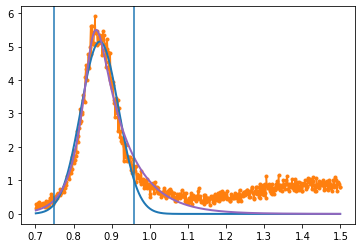

{0.75063844844609284301,0.85284870609189977753,0.01514168911226059129,27.92587969014801885237,13.35605006359086743828,}


<ipython-input-2-4c1619d8b6be>:14: RuntimeWarning: overflow encountered in exp
  (np.exp(0.5 * np.power(sigma * lambda1, 2) + lambda1 * (x - mu)) * erfc(mu1 / (sigma * np.sqrt(2.0))) \
<ipython-input-2-4c1619d8b6be>:15: RuntimeWarning: overflow encountered in exp
  + np.exp(0.5 * np.power(sigma * lambda2, 2) - lambda2 * (x - mu)) * erfc(-mu2 / (sigma * np.sqrt(2.0))))
<ipython-input-2-4c1619d8b6be>:15: RuntimeWarning: invalid value encountered in multiply
  + np.exp(0.5 * np.power(sigma * lambda2, 2) - lambda2 * (x - mu)) * erfc(-mu2 / (sigma * np.sqrt(2.0))))
<ipython-input-2-4c1619d8b6be>:14: RuntimeWarning: invalid value encountered in multiply
  (np.exp(0.5 * np.power(sigma * lambda1, 2) + lambda1 * (x - mu)) * erfc(mu1 / (sigma * np.sqrt(2.0))) \


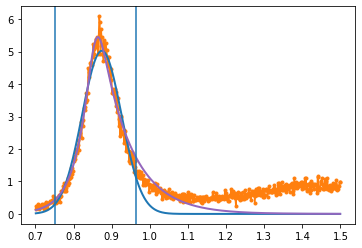

{0.76634962846225640476,0.85821476874672919521,0.01331098702542610375,25.81102488352728485665,12.61111069954237784430,}


<ipython-input-2-4c1619d8b6be>:14: RuntimeWarning: overflow encountered in exp
  (np.exp(0.5 * np.power(sigma * lambda1, 2) + lambda1 * (x - mu)) * erfc(mu1 / (sigma * np.sqrt(2.0))) \
<ipython-input-2-4c1619d8b6be>:15: RuntimeWarning: overflow encountered in exp
  + np.exp(0.5 * np.power(sigma * lambda2, 2) - lambda2 * (x - mu)) * erfc(-mu2 / (sigma * np.sqrt(2.0))))
<ipython-input-2-4c1619d8b6be>:15: RuntimeWarning: invalid value encountered in multiply
  + np.exp(0.5 * np.power(sigma * lambda2, 2) - lambda2 * (x - mu)) * erfc(-mu2 / (sigma * np.sqrt(2.0))))
/usr/local/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


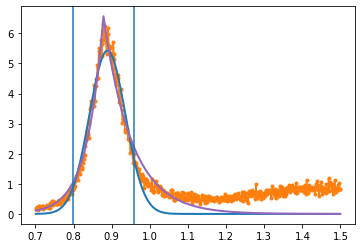

<ipython-input-2-4c1619d8b6be>:14: RuntimeWarning: overflow encountered in exp
  (np.exp(0.5 * np.power(sigma * lambda1, 2) + lambda1 * (x - mu)) * erfc(mu1 / (sigma * np.sqrt(2.0))) \
<ipython-input-2-4c1619d8b6be>:15: RuntimeWarning: overflow encountered in exp
  + np.exp(0.5 * np.power(sigma * lambda2, 2) - lambda2 * (x - mu)) * erfc(-mu2 / (sigma * np.sqrt(2.0))))
<ipython-input-2-4c1619d8b6be>:15: RuntimeWarning: invalid value encountered in multiply
  + np.exp(0.5 * np.power(sigma * lambda2, 2) - lambda2 * (x - mu)) * erfc(-mu2 / (sigma * np.sqrt(2.0))))
<ipython-input-2-4c1619d8b6be>:14: RuntimeWarning: invalid value encountered in multiply
  (np.exp(0.5 * np.power(sigma * lambda1, 2) + lambda1 * (x - mu)) * erfc(mu1 / (sigma * np.sqrt(2.0))) \


{0.77029339510448224804,0.87837895435109336617,0.00000013256080218584,23.08346311190552668791,13.56736830762481638146,}


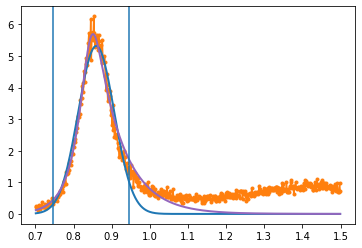

{0.73712487270387117011,0.84521229126524322073,0.01411233077665742693,28.70515185787288103825,14.18068698510771774579,}


<ipython-input-2-4c1619d8b6be>:14: RuntimeWarning: overflow encountered in exp
  (np.exp(0.5 * np.power(sigma * lambda1, 2) + lambda1 * (x - mu)) * erfc(mu1 / (sigma * np.sqrt(2.0))) \
<ipython-input-2-4c1619d8b6be>:14: RuntimeWarning: invalid value encountered in multiply
  (np.exp(0.5 * np.power(sigma * lambda1, 2) + lambda1 * (x - mu)) * erfc(mu1 / (sigma * np.sqrt(2.0))) \
<ipython-input-2-4c1619d8b6be>:15: RuntimeWarning: overflow encountered in exp
  + np.exp(0.5 * np.power(sigma * lambda2, 2) - lambda2 * (x - mu)) * erfc(-mu2 / (sigma * np.sqrt(2.0))))
<ipython-input-2-4c1619d8b6be>:15: RuntimeWarning: invalid value encountered in multiply
  + np.exp(0.5 * np.power(sigma * lambda2, 2) - lambda2 * (x - mu)) * erfc(-mu2 / (sigma * np.sqrt(2.0))))
/usr/local/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


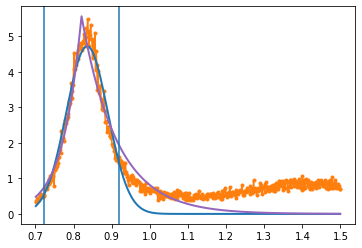

{0.79179377261681560540,0.82058027020644463967,0.00000026522891951452,20.47249506244098071761,10.73677219366874524553,}


In [5]:
data = mm_cut(df)
all_data = pd.concat(data)

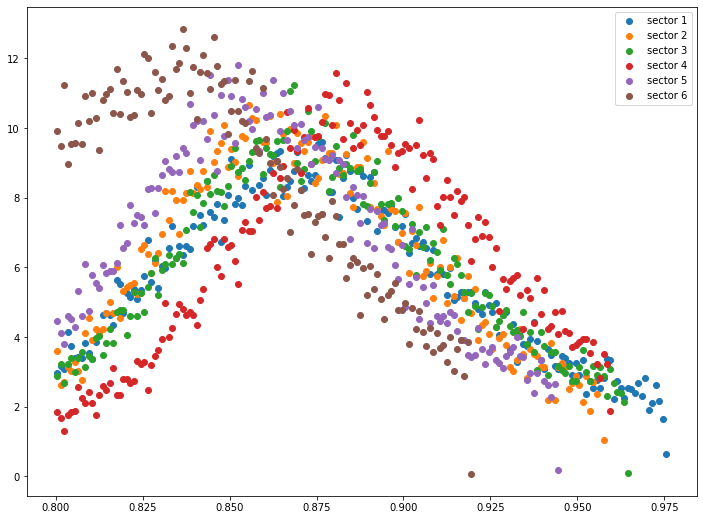

In [6]:
plt.figure(figsize=(12,9))
for i in range(0,6):
    y, x = np.histogram(data[i].mm2, bins=200, density=True, range=(0.8, 1.0))
    x = (x[1:]+x[:-1])/2
    plt.scatter(x[y!=0], y[y!=0], label=f'sector {i+1}')
plt.legend()
plt.show()

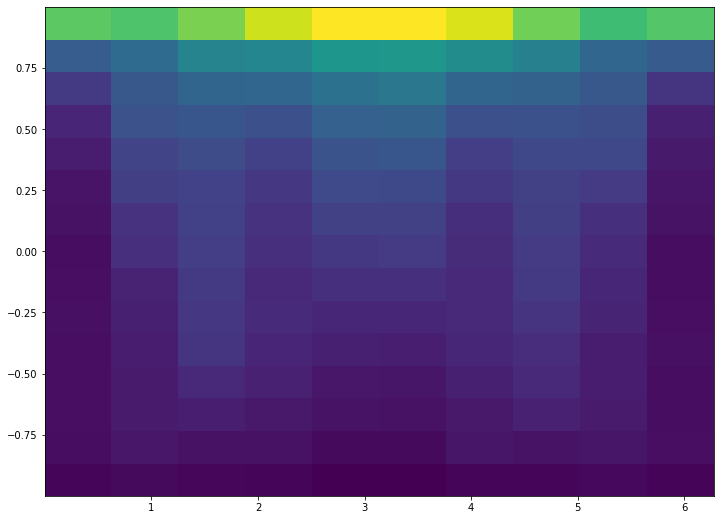

In [7]:
plt.figure(figsize=(12,9))
plt.hist2d(all_data.phi, all_data.cos_theta, bins=(10,15))
plt.show()

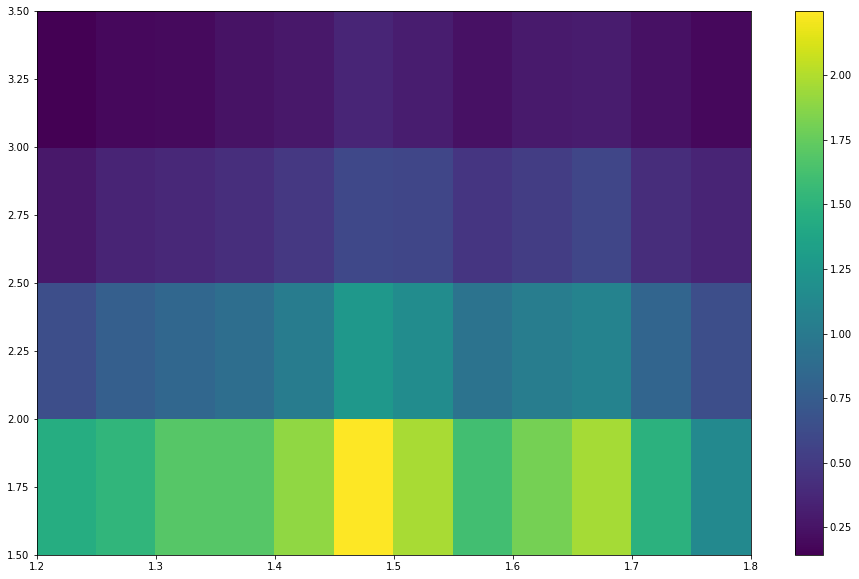

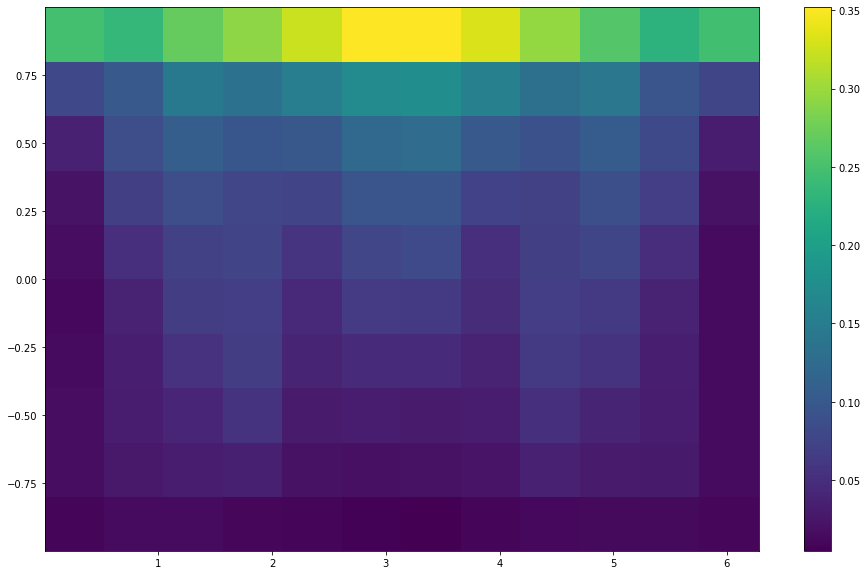

In [8]:
NUM_BINS_W = 12
NUM_BINS_Q2 = 4
NUM_BINS_PHI = 12
NUM_BINS_CT = 10

W_MIN = 1.2
W_MAX = 1.8
Q2_MIN = 1.5
Q2_MAX = 3.5



plt.figure(figsize=(16,10))
counts, w_bins, q2_bins, mesh = plt.hist2d(all_data.w,all_data.q2, 
                                           bins=(NUM_BINS_W, NUM_BINS_Q2), 
                                           range=((W_MIN, W_MAX),(Q2_MIN, Q2_MAX)), 
                                           density=True)
plt.colorbar()
plt.show()

plt.figure(figsize=(16,10))
counts, phi_bins, theta_bins, mesh = plt.hist2d(all_data.phi, all_data.cos_theta, 
                                                bins=(NUM_BINS_PHI, NUM_BINS_CT), 
                                                density=True)
plt.colorbar()
plt.show()

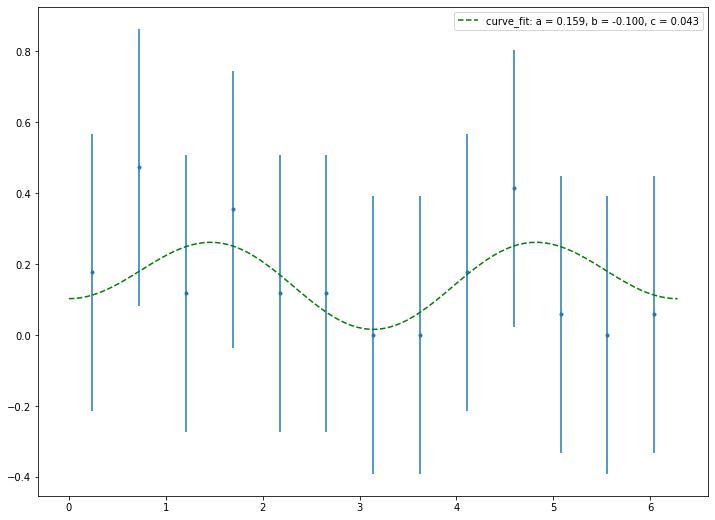

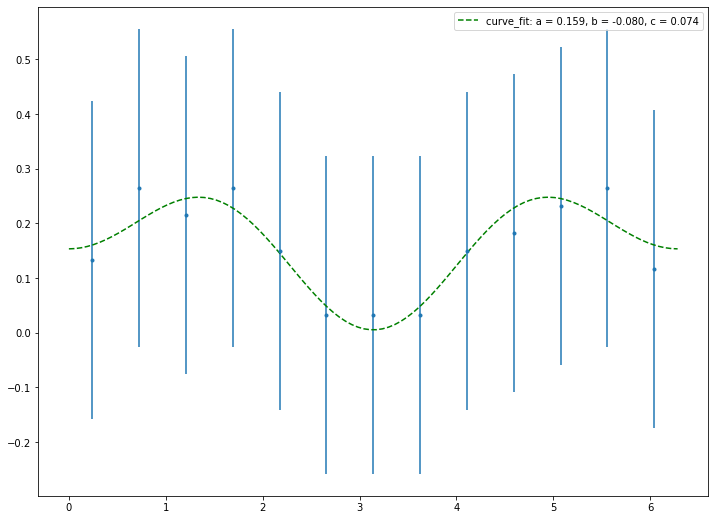

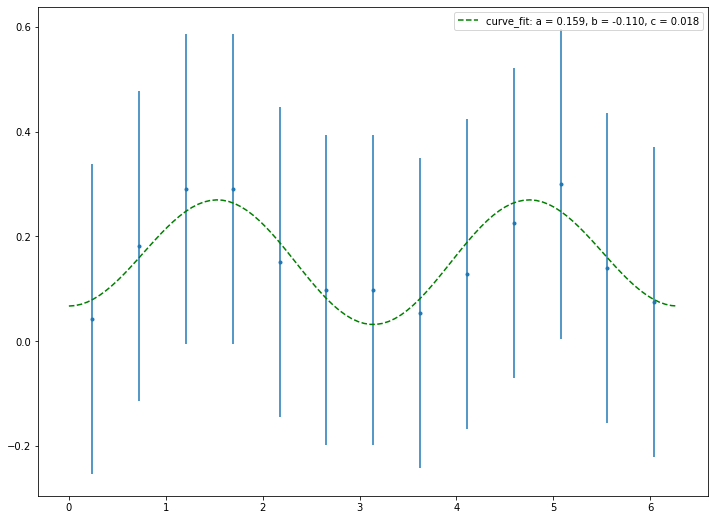

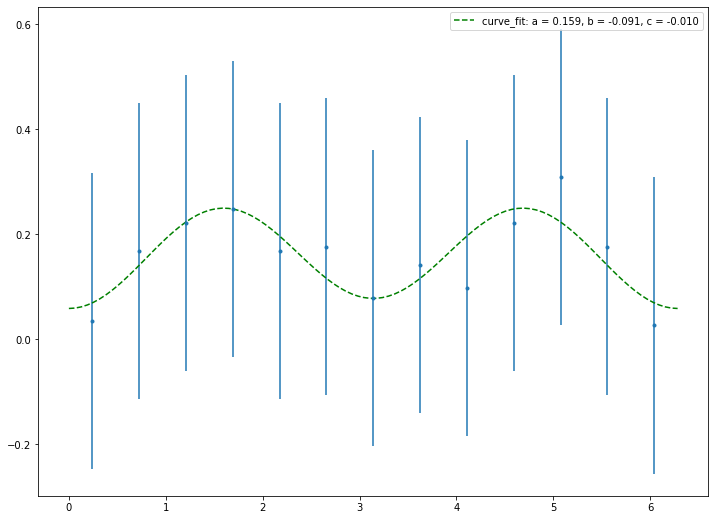

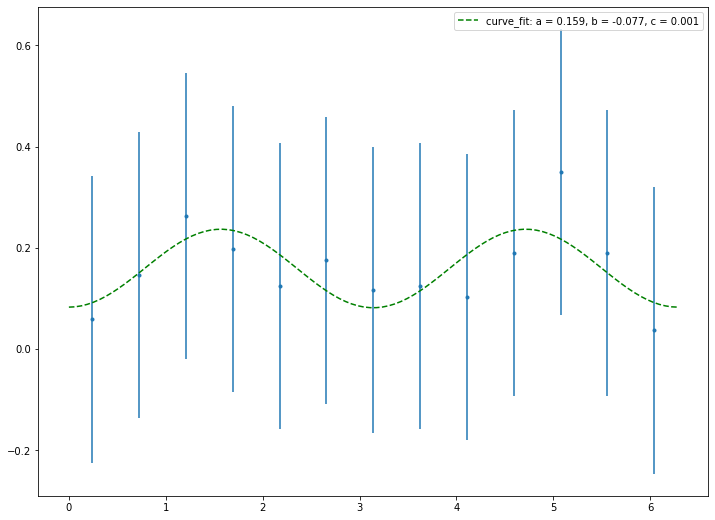

...

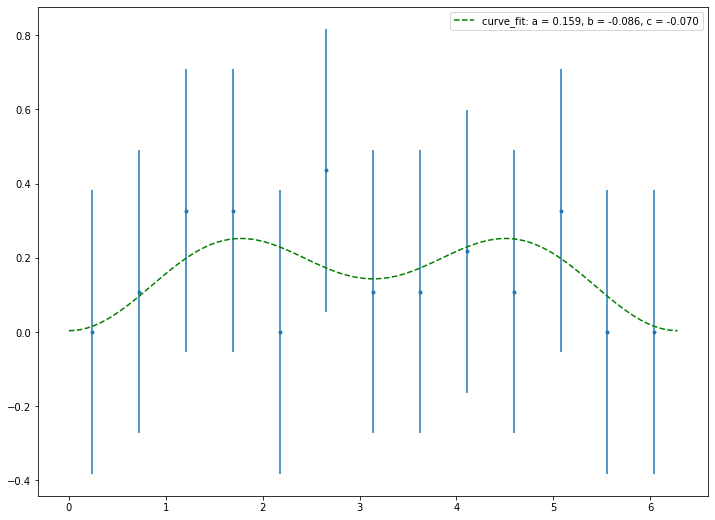

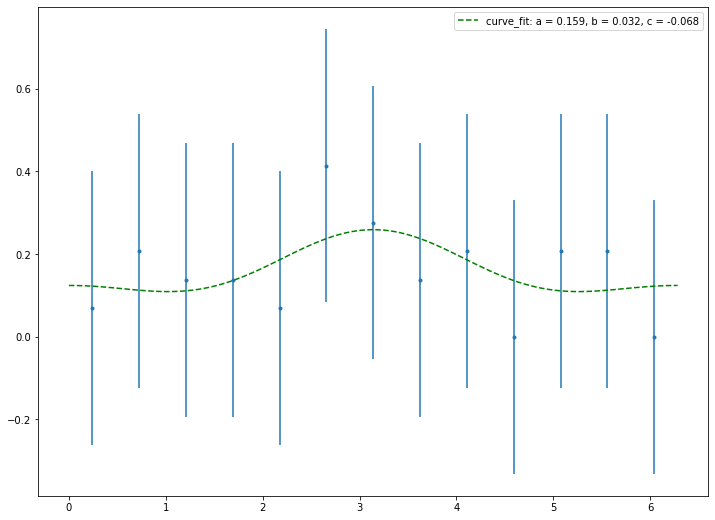

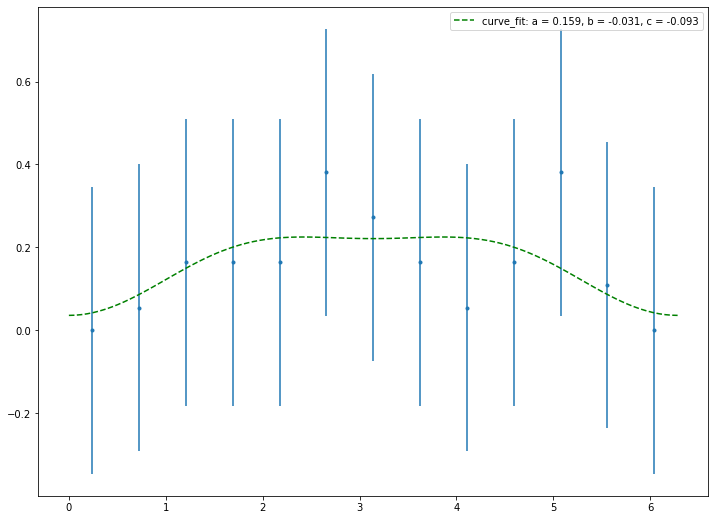

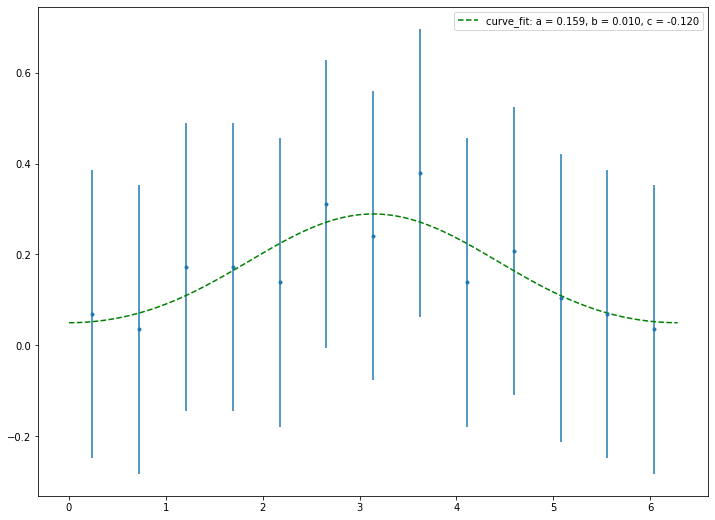

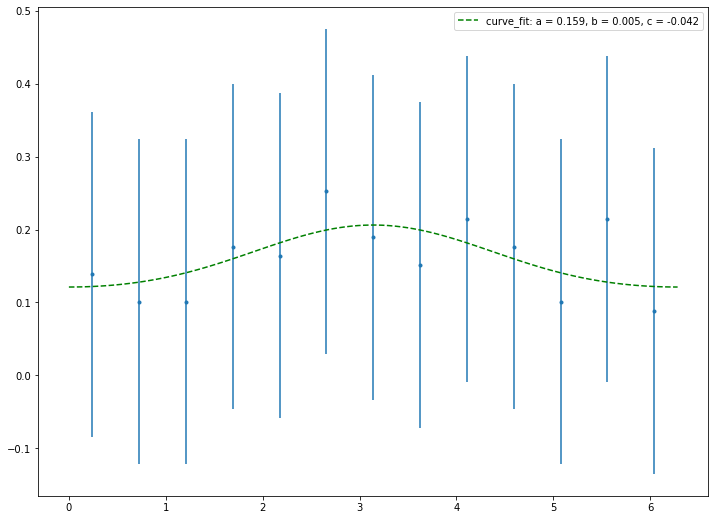

In [9]:
count = 0
for w in range(len(w_bins[:-1])):
    for q2 in range(len(q2_bins[:-1])):
        for cos_t in range(len(theta_bins[:-1])):
            fig = plt.figure(figsize=(12,9))
            count += 1
            # print(f'{theta_bins[cos_t]:0.3f}->{theta_bins[cos_t+1]:0.3f}, {w_bins[w]:0.3f}->{w_bins[w+1]:0.3f}, {q2_bins[q2]:0.3f}->{q2_bins[q2+1]:0.3f}')
            recon = all_data[(all_data.w >= w_bins[w])&
                         (all_data.w < w_bins[w+1])&

                         (all_data.q2 >= q2_bins[q2])&
                         (all_data.q2 < q2_bins[q2+1])&
                         
                         (all_data.cos_theta >= theta_bins[cos_t])&
                         (all_data.cos_theta < theta_bins[cos_t+1])
                        ]
            y, x = np.histogram(recon.phi, bins=len(phi_bins), range=(np.min(phi_bins), np.max(phi_bins)), density=True)
            x = (x[:-1] + x[1:])/ 2.0
            p0 = [np.mean(y), 1.0, 1.0]
            
            popt, pcov = curve_fit(func, x, y, p0=p0, maxfev=800)
            a = popt[0]
            b = popt[1]
            c = popt[2]
            xs = np.linspace(0, 2*np.pi, 100)
            plt.plot(xs, func(xs, *popt), 'g--', 
                                 label=f'curve_fit: a = {a:0.3f}, b = {b:0.3f}, c = {c:0.3f}')
                        
            
            plt.errorbar(x, y, yerr=np.sqrt(np.std(y)), fmt='.')
            #plt.ylim(0,0.5)
            plt.legend()
            plt.show()
